# Assignment B.5 - Modern face recognition with deep learning

Have you noticed that Facebook has developed an uncanny ability to recognize your friends in your photographs? In the old days, Facebook used to make you to tag your friends in photos by clicking on them and typing in their name. Now as soon as you upload a photo, Facebook tags everyone for you like magic. This technology is called face recognition. Facebook’s algorithms are able to recognize your friends’ faces after they have been tagged only a few times. It’s pretty amazing: these algorithms can recognize faces with 98% accuracy, which is pretty much as good as humans can do!

As a human, your brain is wired to recognize faces automatically and instantly. Computers are not capable of doing this, so you have to teach them how to tackle each step in this process. Specifically, a face recognition system goes through four steps: find faces in the image, analyze their facial features, compare against known faces, and make a prediction of the corresponding persons. Here's described the full pipeline.

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/summary.gif" style="height:200px;">

### Table of contents 

In this assignment, you will tackle several problems related to face recognition:
1. **Face detection**. Look at a picture and find all the faces in it. -5
- **Pose estimation**. Understand where the face is turned and correct its pose. 5
- **Face encoding**. Pick up unique features from a face that can be used to distinguish it from others. 5 
- **Face recognition**. Compare the unique features of a face to those of all the people in a database. 5
- **Personal dataset**. Build a custom face recognition dataset. 2

By the end of this notebook, you will have your own face recognition system.

### Required packages

Here are the packages you will need during the assignment.
- [Numpy](http://www.numpy.org)
- [Keras](https://keras.io)
- [OpenCV](https://opencv.org)
- [Dlib](http://dlib.net).

**Note**: In Anaconda Navigator, the package `dlib` can be installed from the **conda-forge** channel. In Google Colab, everything is readily available

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython import display
import cv2
import pickle
from PIL import Image
import os
import keras
from keras.preprocessing.image import ImageDataGenerator
import sklearn
from sklearn.model_selection import train_test_split
import dlib
from tensorflow.keras import utils, layers, models, optimizers, regularizers
from sklearn.preprocessing import LabelEncoder 
from tensorflow.keras.utils import to_categorical
import time

## 1. Face detection

The first step in your pipeline is face detection. Obviously you need to locate the faces in a photograph before you can try to tell them apart. If you’ve used any camera in the last 10 years, you’ve probably seen face detection in action. Face detection is a great feature for cameras. When the camera can automatically pick out faces, it can make sure that all the faces are in focus before it takes the picture. But you’ll use it for a different purpose:  finding the areas of the image you want to pass on to the next step in your pipeline.

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/detection.jpg" style="height:200px;">

### Assignment

Here's what you are required to do for this part of the assignment.

- You are provided with a small dataset of pictures, where each picture contains exactly one face. Extract the faces and their labels (i.e., the person's names). Store them to a new file with the function `dump` in the package `pickle`.


-  Normalize the cropped faces (i.e., divide the pixel values by 255), and split them in train set (70%) and test set (30%) with the function `train_test_split` in the package `sklearn`. 


- Train a small convnet and check its performance on the test set. Remember: don't use the test images for training.


- Try to improve the performance of the baseline convnet by using all the tricks you have learned in the course.

#### Provided functions

Here you will find some useful functions to complete the assignment.

In [2]:
!wget https://perso.esiee.fr/~najmanl/FaceRecognition/models.zip
!unzip models.zip

--2023-04-21 18:47:56--  https://perso.esiee.fr/~najmanl/FaceRecognition/models.zip
Resolving perso.esiee.fr (perso.esiee.fr)... 147.215.150.8
Connecting to perso.esiee.fr (perso.esiee.fr)|147.215.150.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 100563300 (96M) [application/zip]
Saving to: ‘models.zip’

models.zip          100%[===================>]  95.90M  37.1MB/s    in 2.6s    

2023-04-21 18:47:59 (37.1 MB/s) - ‘models.zip’ saved [100563300/100563300]

Archive:  models.zip
   creating: models/
  inflating: models/shape_predictor_68_face_landmarks.dat  
   creating: __MACOSX/
   creating: __MACOSX/models/
  inflating: __MACOSX/models/._shape_predictor_68_face_landmarks.dat  
  inflating: models/mmod_human_face_detector.dat  
  inflating: __MACOSX/models/._mmod_human_face_detector.dat  
  inflating: models/dlib_face_recognition_resnet_model_v1.dat  
  inflating: __MACOSX/models/._dlib_face_recognition_resnet_model_v1.dat  
  inflating: models/shape_pre

In [3]:
hog_detector = dlib.get_frontal_face_detector()
cnn_detector = dlib.cnn_face_detection_model_v1('models/mmod_human_face_detector.dat')

def face_locations(image, model="hog"):
    
    if model == "hog":
        detector = hog_detector
        cst = 0
    elif model == "cnn":
        detector = cnn_detector
        cst = 10
            
    matches = detector(image,1)
    rects   = []
    
    for r in matches:
        if model == "cnn":
            r = r.rect
        x = max(r.left(), 0)
        y = max(r.top(), 0)
        w = min(r.right(), image.shape[1]) - x + cst
        h = min(r.bottom(), image.shape[0]) - y + cst
        rects.append((x,y,w,h))
        
    return rects

In [4]:
def extract_faces(image, model="hog"):
    
    gray  = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    rects = face_locations(gray, model)
    faces = []
    
    for (x,y,w,h) in rects:
        cropped = image[y:y+h, x:x+w, :]
        cropped = cv2.resize(cropped, (128,128))
        faces.append(cropped)
            
    return faces

In [5]:
def show_grid(faces, figsize=(12,3)):

    n = len(faces)
    cols = 7
    rows = int(np.ceil(n/cols))
    
    fig, ax = plt.subplots(rows,cols, figsize=figsize)

    for r in range(rows):
        for c in range(cols):
            i = r*cols + c
            if i == n:
                 break
            ax[r,c].imshow(faces[i])
            ax[r,c].axis('off')
            #ax[r,c].set_title('size: ' + str(faces[i].shape[:2]))

In [6]:


def list_images(basePath, validExts=(".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".heic"), contains=None):
    
    imagePaths = []
    
    # loop over the directory structure
    for (rootDir, dirNames, filenames) in os.walk(basePath):
        # loop over the filenames in the current directory
        for filename in filenames:
            # if the contains string is not none and the filename does not contain
            # the supplied string, then ignore the file
            if contains is not None and filename.find(contains) == -1:
                continue

            # determine the file extension of the current file
            ext = filename[filename.rfind("."):].lower()

            # check to see if the file is an image and should be processed
            if ext.endswith(validExts):
                # construct the path to the image and yield it
                imagePath = os.path.join(rootDir, filename).replace(" ", "\\ ")
                imagePaths.append(imagePath)
    
    return imagePaths

In [7]:
def dump_pickle(filePath, labels):
    
    data = []
    l = []
    
    for i in filePath:
        image = cv2.imread(i)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        faces = extract_faces(image, "cnn")
        if faces != []:
          data.append(list(faces[0]))
          for label in labels:
              if label in i:
                l.append(label)
                break
                    
    # enregistrer la liste dans un fichier avec pickle.dump()
    with open("image.pickle", "wb") as f:
        pickle.dump((data, l), f)

#### Hints

The provided function `extract_faces()` applies face detection to a single input image, and returns a list of 128x128 blocks containing the detected faces.

In [8]:
!wget https://perso.esiee.fr/~najmanl/FaceRecognition/figures.zip
!unzip figures.zip

--2023-04-21 18:48:08--  https://perso.esiee.fr/~najmanl/FaceRecognition/figures.zip
Resolving perso.esiee.fr (perso.esiee.fr)... 147.215.150.8
Connecting to perso.esiee.fr (perso.esiee.fr)|147.215.150.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21536933 (21M) [application/zip]
Saving to: ‘figures.zip’

figures.zip         100%[===================>]  20.54M  28.0MB/s    in 0.7s    

2023-04-21 18:48:09 (28.0 MB/s) - ‘figures.zip’ saved [21536933/21536933]

Archive:  figures.zip
   creating: figures/
  inflating: figures/test.gif        
   creating: __MACOSX/figures/
  inflating: __MACOSX/figures/._test.gif  
  inflating: figures/pose.png        
  inflating: __MACOSX/figures/._pose.png  
  inflating: figures/summary.gif     
  inflating: __MACOSX/figures/._summary.gif  
  inflating: figures/encoding.png    
  inflating: __MACOSX/figures/._encoding.png  
  inflating: figures/triplet.png     
  inflating: __MACOSX/figures/._triplet.png  
  inflating: figu

Moreover, the function `list_images()` locates all the jpeg/png/tiff files in a given folder (including its subfolders).

In [9]:
!wget https://perso.esiee.fr/~najmanl/FaceRecognition/data.zip
!unzip data.zip

--2023-04-21 18:48:10--  https://perso.esiee.fr/~najmanl/FaceRecognition/data.zip
Resolving perso.esiee.fr (perso.esiee.fr)... 147.215.150.8
Connecting to perso.esiee.fr (perso.esiee.fr)|147.215.150.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 91829333 (88M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  87.58M  37.4MB/s    in 2.3s    

2023-04-21 18:48:12 (37.4 MB/s) - ‘data.zip’ saved [91829333/91829333]

Archive:  data.zip
   creating: data/
   creating: data/owen_grady/
  inflating: data/owen_grady/00000010.jpg  
   creating: __MACOSX/data/
   creating: __MACOSX/data/owen_grady/
  inflating: __MACOSX/data/owen_grady/._00000010.jpg  
  inflating: data/owen_grady/00000004.jpg  
  inflating: __MACOSX/data/owen_grady/._00000004.jpg  
  inflating: data/owen_grady/00000005.jpg  
  inflating: __MACOSX/data/owen_grady/._00000005.jpg  
  inflating: data/owen_grady/00000007.jpg  
  inflating: __MACOSX/data/owen_grady/._

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
imagePaths = list_images("/content/drive/MyDrive/projet_deep_learning/photo")
imagePaths_test = list_images("data")
train_dir = "/content/drive/MyDrive/projet_deep_learning/photo"
imagePaths[1]

'/content/drive/MyDrive/projet_deep_learning/photo/Nathan_Levy/Nathan2.jpg'

In [12]:
len(imagePaths)

752

In [13]:
list_labels = os.listdir(train_dir)
list_labels

['Nathan_Levy',
 'Gregoire_Ugollini',
 'Vincent_Bernart',
 'Remi_Labou',
 'Camille_Lefebvre',
 'Valentin_Lallier',
 'Martin_Rouge',
 'Amaury_Bodin',
 'Adrien_Lindeberg',
 'Lucas_Licciardello',
 'Candice_Marchand',
 'Alexandre_Lecoeuvre']

In [14]:
dump_pickle(imagePaths, list_labels)

In [15]:
with open("image.pickle", "rb") as f:
    data, labels = pickle.load(f)

In [16]:
labels = np.array(labels)
data = np.array(data)

In [17]:
print(data.shape)
print(labels.shape)

(752, 128, 128, 3)
(752,)


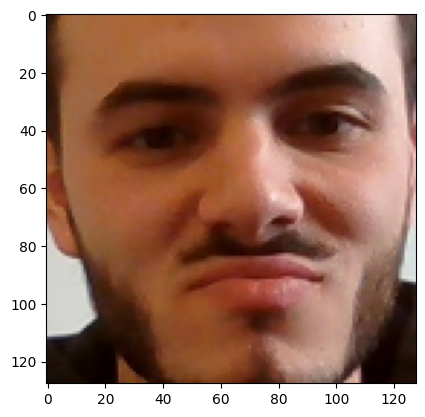

In [18]:
plt.imshow(data[0])

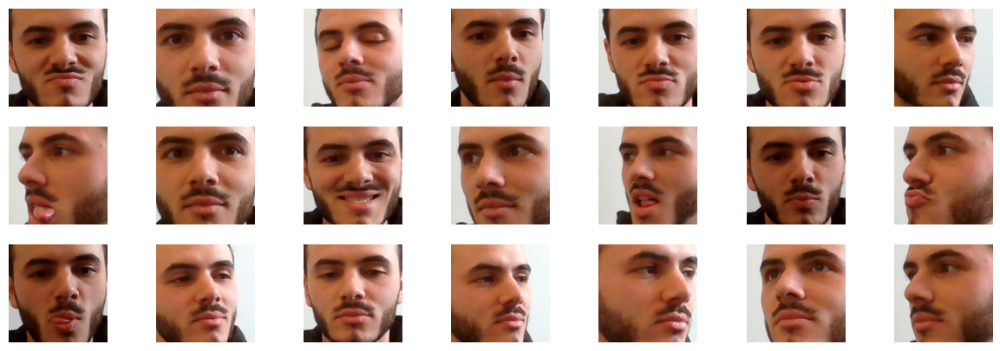

In [19]:
show_grid(data[:21], figsize=(15,5))

In [20]:
data = data.astype('float32') / 255.0

In [21]:
data[0]

array([[[0.16078432, 0.08627451, 0.0627451 ],
        [0.16862746, 0.09411765, 0.05490196],
        [0.20392157, 0.10588235, 0.05098039],
        ...,
        [0.40392157, 0.3372549 , 0.30588236],
        [0.39215687, 0.33333334, 0.3137255 ],
        [0.34901962, 0.29803923, 0.30980393]],

       [[0.17254902, 0.09803922, 0.07450981],
        [0.17254902, 0.10196079, 0.07058824],
        [0.21176471, 0.10196079, 0.05490196],
        ...,
        [0.40392157, 0.33333334, 0.30588236],
        [0.4       , 0.34117648, 0.32156864],
        [0.34509805, 0.2901961 , 0.2901961 ]],

       [[0.18039216, 0.10588235, 0.08235294],
        [0.1764706 , 0.10588235, 0.07450981],
        [0.24313726, 0.11764706, 0.07058824],
        ...,
        [0.39215687, 0.31764707, 0.29411766],
        [0.3882353 , 0.32156864, 0.30588236],
        [0.35686275, 0.29803923, 0.2901961 ]],

       ...,

       [[0.10196079, 0.0627451 , 0.02352941],
        [0.10588235, 0.06666667, 0.03137255],
        [0.10196079, 0

In [22]:
nb_classe = 12
d = {i: j for i, j in zip(list_labels, range(nb_classe))}
l = [d[i] for i in labels]
label_cat = np.array(utils.to_categorical(l, num_classes=nb_classe))

In [23]:
print(data.shape)
print(label_cat.shape)

(752, 128, 128, 3)
(752, 12)


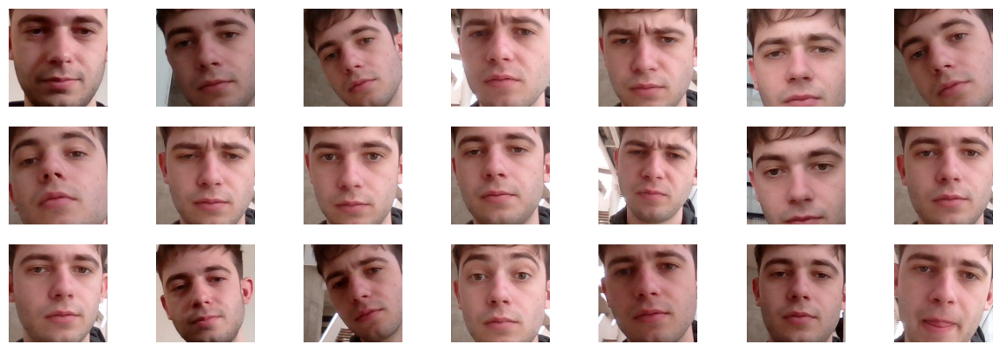

In [24]:
show_grid(data[520:541], figsize=(15,5))

In [25]:
# Séparer les données et les étiquettes
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(data, label_cat, test_size=0.3, random_state=42)

(226, 128, 128, 3)
(226, 12)


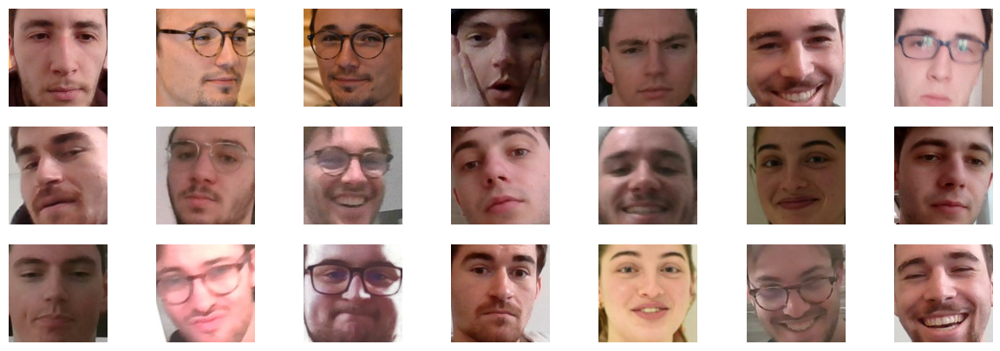

In [26]:
print(X_test.shape)
print(y_test.shape)
show_grid(X_train[:21], figsize=(15,5))

In [27]:
X_valid, y_valid = X_train[int(len(X_train)*0.8):], y_train[int(len(y_train)*0.8):]
X_train, y_train = X_train[:int(len(X_train)*0.8)], y_train[:int(len(y_train)*0.8)]

In [28]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)

(420, 128, 128, 3) (420, 12)
(106, 128, 128, 3) (106, 12)


In [29]:
# Data augmentation
data_gen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)

In [30]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dropout(rate = 0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(nb_classe, activation='softmax'))

In [31]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 flatten (Flatten)           (None, 100352)            0

In [32]:
model.compile(optimizer=optimizers.Adam(lr=1e-4), loss="categorical_crossentropy", metrics=["acc"]) 

In [33]:
# Train the model with data augmentation
batch_size = 64
steps_per_epoch = len(X_train) // batch_size
history = model.fit(data_gen.flow(X_train, y_train, batch_size=batch_size),
                    steps_per_epoch=steps_per_epoch,
                    epochs=30,
                    validation_data=(X_valid, y_valid),
                    verbose=1)

Epoch 1/30
6/6 [==============================] - 7s 393ms/step - loss: 2.6747 - acc: 0.0843 - val_loss: 2.4911 - val_acc: 0.0849
Epoch 2/30
6/6 [==============================] - 2s 248ms/step - loss: 2.4597 - acc: 0.1039 - val_loss: 2.4263 - val_acc: 0.1698
Epoch 3/30
6/6 [==============================] - 2s 249ms/step - loss: 2.3534 - acc: 0.2331 - val_loss: 2.2535 - val_acc: 0.2075
Epoch 4/30
6/6 [==============================] - 1s 237ms/step - loss: 2.0962 - acc: 0.2865 - val_loss: 2.0744 - val_acc: 0.3208
Epoch 5/30
6/6 [==============================] - 2s 340ms/step - loss: 1.8947 - acc: 0.3652 - val_loss: 1.8072 - val_acc: 0.3302
Epoch 6/30
6/6 [==============================] - 2s 385ms/step - loss: 1.6711 - acc: 0.4298 - val_loss: 1.4930 - val_acc: 0.5000
Epoch 7/30
6/6 [==============================] - 2s 261ms/step - loss: 1.4166 - acc: 0.5339 - val_loss: 1.5092 - val_acc: 0.4623
Epoch 8/30
6/6 [==============================] - 1s 241ms/step - loss: 1.3464 - acc: 0.56

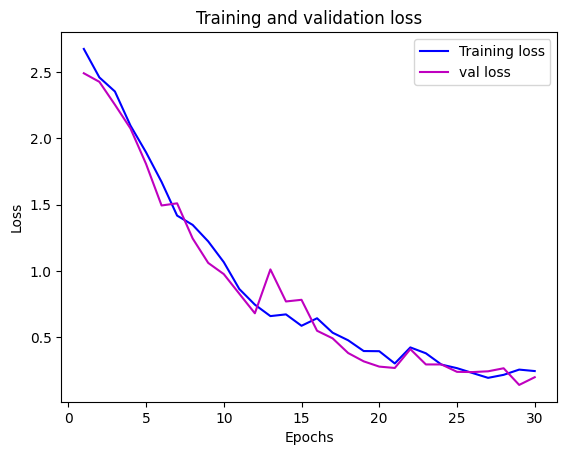

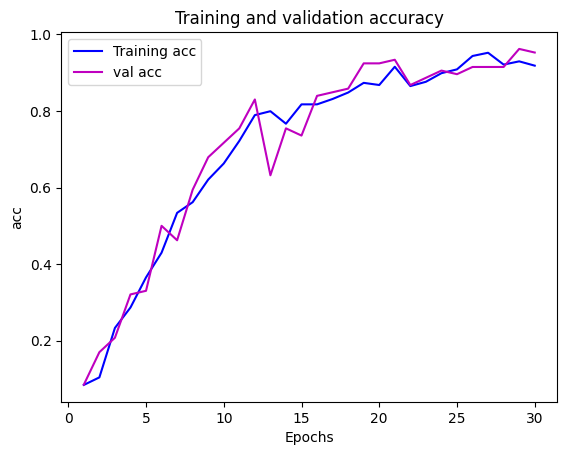

In [34]:
train_acc = history.history['acc']
val_acc = history.history['val_acc']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_loss, linestyle='-', color='b', label='Training loss')
plt.plot(epochs, val_loss, linestyle='-', color='m', label='val loss')

plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.figure()
plt.plot(epochs, train_acc, linestyle='-', color='b', label='Training acc')
plt.plot(epochs, val_acc, linestyle='-', color='m', label='val acc')

plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('acc')
plt.legend()

plt.show()

In [35]:
proba = model.predict(X_test)

8/8 [==============================] - 0s 22ms/step


In [36]:
np.sum(proba[0])

0.99999994

In [37]:
d_pred = {j: i for i, j in zip(list_labels, range(nb_classe))}

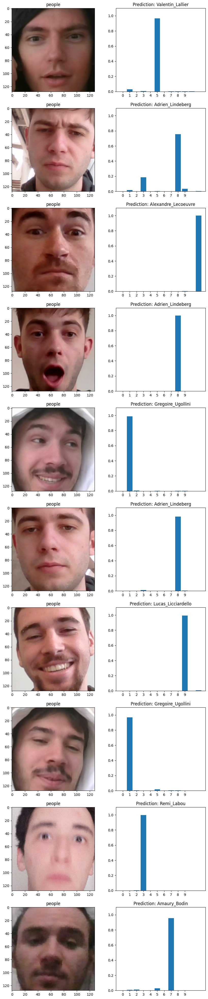

In [38]:
n = 10
batch_size = np.random.randint(0, 54)

inputs  = X_test[batch_size : n+batch_size]
outputs = proba[batch_size : n+batch_size]

f, ax = plt.subplots(10 ,2, figsize=(10,50))
for i in range(n):
    ax[i,0].imshow(inputs[i, :, :, :])
    ax[i,0].set_title("people")
    ax[i,1].bar(range(nb_classe), outputs[i,:])
    ax[i,1].set_title(f"Prediction: {d_pred[np.argmax(outputs[i])]}")
    ax[i,1].set_xticks(range(10))
    ax[i,1].set_ylim((0,1.1))
    
plt.show()

In [39]:
test_loss, test_acc = model.evaluate(X_test, y_test)

print("Test accuracy:", test_acc*100, "%")

8/8 [==============================] - 0s 10ms/step - loss: 0.2207 - acc: 0.9292
Test accuracy: 92.92035102844238 %


In [40]:
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
del model
gc.collect()

821

## 2. Pose estimation

You have isolated the faces in our image. But now you have to deal with the problem that faces turned different directions look totally different to a computer. To account for this, you will try to warp each picture so that the eyes and lips are always in the same place in the image. More concretely, you are going to use an algorithm called face landmark estimation. The basic idea is to locate 68 specific points (called landmarks) that exist on every face:  the top of the chin, the outside edge of each eye, the inner edge of each eyebrow, etc. Then, you’ll simply rotate, scale and shear the image so that the eyes and mouth are centered as best as possible. This will make face recognition more accurate.

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/pose.png" style="height:200px;">

### Assignment

Here's what you are required to do for this part of the assignment.

- Further preprocess the face pictures by correcting their pose. You should now have a dataset of cropped, aligned, and normalized faces.


- Re-train your convnets on the modified dataset. 


- Evaluate the performance on the test set, and compare it to the scores obtained with your previously trained convnets.

#### Provided functions

Here you will find some useful functions to complete the assignment.

In [41]:
pose68 = dlib.shape_predictor('models/shape_predictor_68_face_landmarks.dat')
pose05 = dlib.shape_predictor('models/shape_predictor_5_face_landmarks.dat')

def face_landmarks(face, model="large"):
    
    if model == "large":
        predictor = pose68
    elif model == "small":
        predictor = pose05
    
    if not isinstance(face, list):
        rect = dlib.rectangle(0,0,face.shape[1],face.shape[0])
        return predictor(face, rect)
    else:
        rect = dlib.rectangle(0,0,face[0].shape[1],face[0].shape[0])
        return [predictor(f,rect) for f in face]

In [42]:
def shape_to_coords(shape):
    return np.float32([[p.x, p.y] for p in shape.parts()])

In [43]:
TEMPLATE = np.float32([
    (0.0792396913815, 0.339223741112), (0.0829219487236, 0.456955367943),
    (0.0967927109165, 0.575648016728), (0.122141515615, 0.691921601066),
    (0.168687863544, 0.800341263616), (0.239789390707, 0.895732504778),
    (0.325662452515, 0.977068762493), (0.422318282013, 1.04329000149),
    (0.531777802068, 1.06080371126), (0.641296298053, 1.03981924107),
    (0.738105872266, 0.972268833998), (0.824444363295, 0.889624082279),
    (0.894792677532, 0.792494155836), (0.939395486253, 0.681546643421),
    (0.96111933829, 0.562238253072), (0.970579841181, 0.441758925744),
    (0.971193274221, 0.322118743967), (0.163846223133, 0.249151738053),
    (0.21780354657, 0.204255863861), (0.291299351124, 0.192367318323),
    (0.367460241458, 0.203582210627), (0.4392945113, 0.233135599851),
    (0.586445962425, 0.228141644834), (0.660152671635, 0.195923841854),
    (0.737466449096, 0.182360984545), (0.813236546239, 0.192828009114),
    (0.8707571886, 0.235293377042), (0.51534533827, 0.31863546193),
    (0.516221448289, 0.396200446263), (0.517118861835, 0.473797687758),
    (0.51816430343, 0.553157797772), (0.433701156035, 0.604054457668),
    (0.475501237769, 0.62076344024), (0.520712933176, 0.634268222208),
    (0.565874114041, 0.618796581487), (0.607054002672, 0.60157671656),
    (0.252418718401, 0.331052263829), (0.298663015648, 0.302646354002),
    (0.355749724218, 0.303020650651), (0.403718978315, 0.33867711083),
    (0.352507175597, 0.349987615384), (0.296791759886, 0.350478978225),
    (0.631326076346, 0.334136672344), (0.679073381078, 0.29645404267),
    (0.73597236153, 0.294721285802), (0.782865376271, 0.321305281656),
    (0.740312274764, 0.341849376713), (0.68499850091, 0.343734332172),
    (0.353167761422, 0.746189164237), (0.414587777921, 0.719053835073),
    (0.477677654595, 0.706835892494), (0.522732900812, 0.717092275768),
    (0.569832064287, 0.705414478982), (0.635195811927, 0.71565572516),
    (0.69951672331, 0.739419187253), (0.639447159575, 0.805236879972),
    (0.576410514055, 0.835436670169), (0.525398405766, 0.841706377792),
    (0.47641545769, 0.837505914975), (0.41379548902, 0.810045601727),
    (0.380084785646, 0.749979603086), (0.477955996282, 0.74513234612),
    (0.523389793327, 0.748924302636), (0.571057789237, 0.74332894691),
    (0.672409137852, 0.744177032192), (0.572539621444, 0.776609286626),
    (0.5240106503, 0.783370783245), (0.477561227414, 0.778476346951)])

TPL_MIN, TPL_MAX = np.min(TEMPLATE, axis=0), np.max(TEMPLATE, axis=0)
MINMAX_TEMPLATE = (TEMPLATE - TPL_MIN) / (TPL_MAX - TPL_MIN)

INNER_EYES_AND_BOTTOM_LIP = np.array([39, 42, 57])
OUTER_EYES_AND_NOSE = np.array([36, 45, 33])

In [44]:
def align_faces(images, landmarks, idx=INNER_EYES_AND_BOTTOM_LIP):
    faces = []
    for (img, marks) in zip(images, landmarks):
        imgDim = img.shape[0]
        coords = shape_to_coords(marks)
        H = cv2.getAffineTransform(coords[idx], imgDim * MINMAX_TEMPLATE[idx])
        warped = cv2.warpAffine(img, H, (imgDim, imgDim))
        faces.append(warped)
    return faces

#### Hints

The provided function `face_landmarks()` computes the landmarks for a list of cropped faces.

In [45]:
#second parts

In [46]:
with open("image.pickle", "rb") as f:
    data, labels = pickle.load(f)

In [47]:
labels = np.array(labels)
data = np.array(data)

In [48]:
print(data.shape)
print(labels.shape)

(752, 128, 128, 3)
(752,)


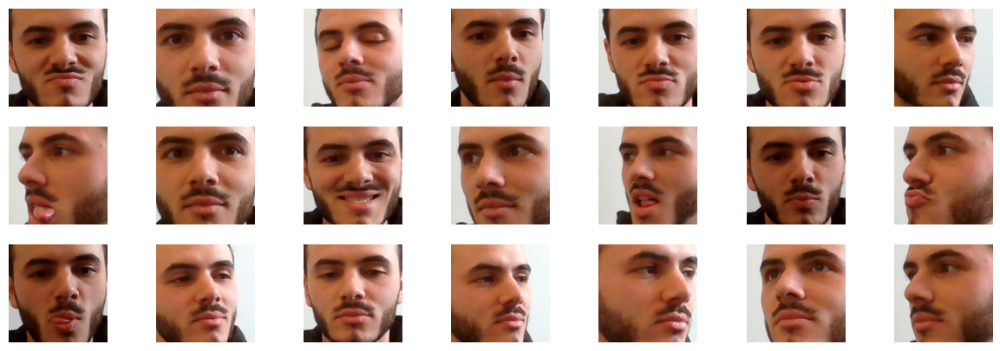

In [49]:
show_grid(data[:21], figsize=(15,5))

In [50]:
landmarks = face_landmarks(list(data))

In [51]:
pose = []
for (face,shape) in zip(data, landmarks):
    canvas = face.copy()
    coords = shape_to_coords(shape)
    for p in coords:
        cv2.circle(canvas, (int(p[0]),int(p[1])), 1, (0, 0, 255), -1)
    pose.append(canvas)

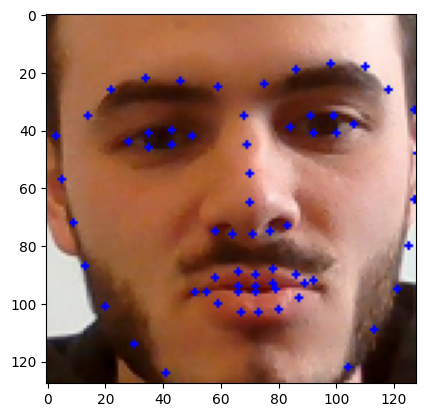

In [52]:
plt.imshow(pose[5])

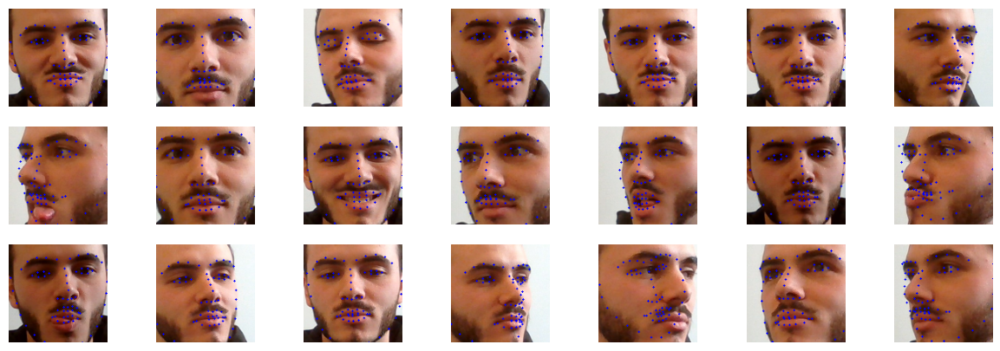

In [53]:
show_grid(pose[:21], figsize=(15,5))

In [54]:
aligned = align_faces(data, landmarks)

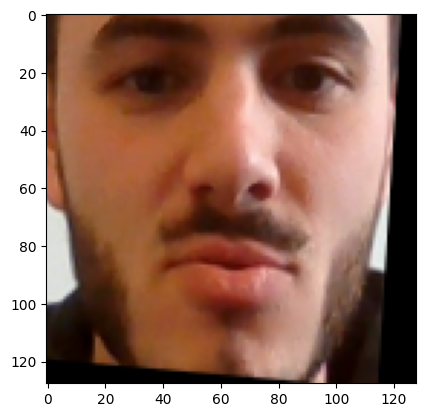

In [55]:
plt.imshow(aligned[5])

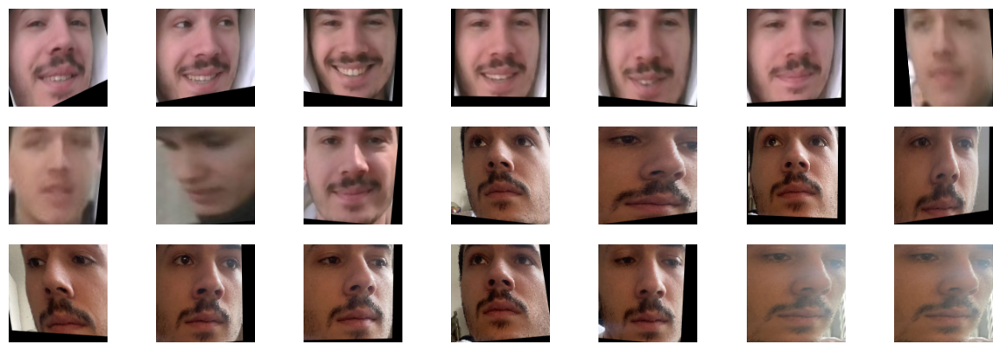

In [56]:
show_grid(aligned[100:121], figsize=(15,5))

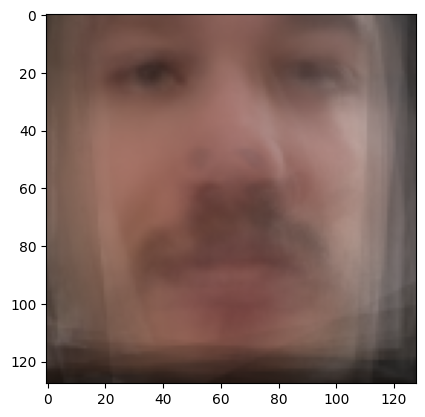

In [57]:
plt.imshow( np.stack(aligned[100:121], axis=3).astype(np.float32).mean(axis=3)/255 )

In [58]:
aligned = np.array(aligned)
aligned = aligned.astype('float32') / 255

In [59]:
aligned[0]

array([[[0.16078432, 0.08627451, 0.03921569],
        [0.18039216, 0.09411765, 0.03529412],
        [0.21568628, 0.10196079, 0.03137255],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.16470589, 0.09411765, 0.03921569],
        [0.18431373, 0.09411765, 0.04705882],
        [0.21960784, 0.10588235, 0.03921569],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       [[0.16470589, 0.09019608, 0.04313726],
        [0.18431373, 0.09411765, 0.04705882],
        [0.21960784, 0.10980392, 0.03921569],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]],

       ...,

       [[0.10588235, 0.04705882, 0.01176471],
        [0.10196079, 0.04313726, 0.01176471],
        [0.09411765, 0

In [60]:
# Séparer les données et les étiquettes
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(aligned, label_cat, test_size=0.3, random_state=42)

(226, 128, 128, 3)
(226, 12)


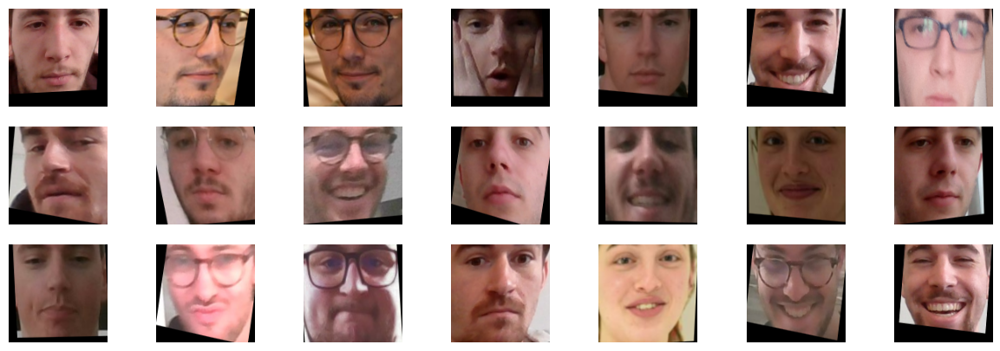

In [61]:
print(X_test.shape)
print(y_test.shape)
show_grid(X_train[:21], figsize=(15,5))

In [62]:
X_valid, y_valid = X_train[int(len(X_train)*0.75):], y_train[int(len(y_train)*0.75):]
X_train, y_train = X_train[:int(len(X_train)*0.75)], y_train[:int(len(y_train)*0.75)]

In [63]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)

(394, 128, 128, 3) (394, 12)
(132, 128, 128, 3) (132, 12)


In [64]:
#use same model first part

In [65]:
# Data augmentation
data_gen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)

In [66]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dropout(rate = 0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(nb_classe, activation='softmax'))

In [67]:
model.compile(optimizer=optimizers.Adam(lr=1e-4), loss="categorical_crossentropy", metrics=["acc"]) 

In [68]:
# Train the model with data augmentation
batch_size = 64
steps_per_epoch = len(X_train) // batch_size
history = model.fit(data_gen.flow(X_train, y_train, batch_size=batch_size),
                    steps_per_epoch=steps_per_epoch,
                    epochs=40,
                    validation_data=(X_valid, y_valid),
                    verbose=1)

Epoch 1/40
6/6 [==============================] - 5s 327ms/step - loss: 2.8895 - acc: 0.0970 - val_loss: 2.4755 - val_acc: 0.0985
Epoch 2/40
6/6 [==============================] - 1s 225ms/step - loss: 2.4628 - acc: 0.0848 - val_loss: 2.4184 - val_acc: 0.1818
Epoch 3/40
6/6 [==============================] - 1s 277ms/step - loss: 2.3791 - acc: 0.1606 - val_loss: 2.2323 - val_acc: 0.2121
Epoch 4/40
6/6 [==============================] - 1s 215ms/step - loss: 2.1710 - acc: 0.2727 - val_loss: 1.9559 - val_acc: 0.3788
Epoch 5/40
6/6 [==============================] - 1s 221ms/step - loss: 1.9835 - acc: 0.3364 - val_loss: 1.7019 - val_acc: 0.4470
Epoch 6/40
6/6 [==============================] - 2s 352ms/step - loss: 1.7362 - acc: 0.4455 - val_loss: 1.6143 - val_acc: 0.4091
Epoch 7/40
6/6 [==============================] - 2s 357ms/step - loss: 1.5514 - acc: 0.4515 - val_loss: 1.4018 - val_acc: 0.5455
Epoch 8/40
6/6 [==============================] - 1s 228ms/step - loss: 1.3428 - acc: 0.54

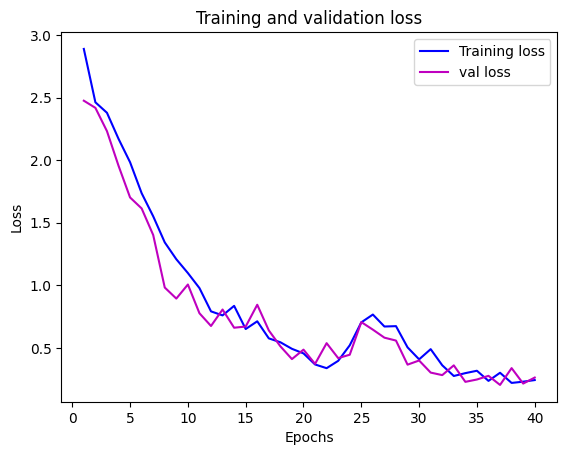

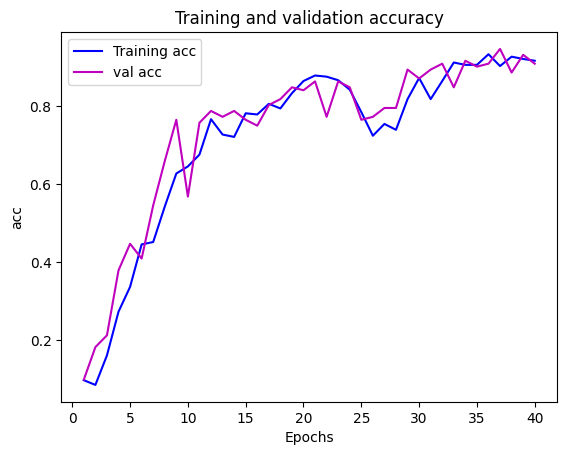

In [69]:
train_acc = history.history['acc']
val_acc = history.history['val_acc']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_loss, linestyle='-', color='b', label='Training loss')
plt.plot(epochs, val_loss, linestyle='-', color='m', label='val loss')

plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.figure()
plt.plot(epochs, train_acc, linestyle='-', color='b', label='Training acc')
plt.plot(epochs, val_acc, linestyle='-', color='m', label='val acc')

plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('acc')
plt.legend()

plt.show()

In [70]:
proba = model.predict(X_test)

8/8 [==============================] - 0s 8ms/step


In [71]:
np.sum(proba[0])

1.0

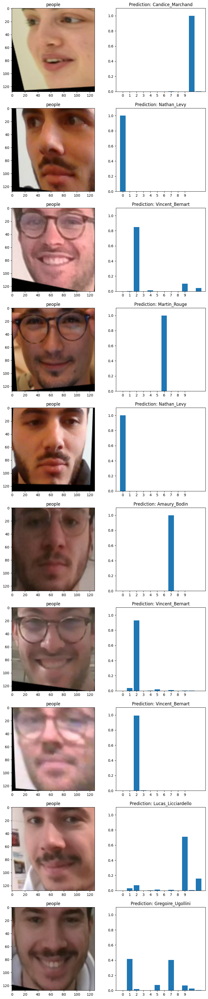

In [72]:
n = 10
batch_size = np.random.randint(0, 54)

inputs  = X_test[batch_size : n+batch_size]
outputs = proba[batch_size : n+batch_size]

f, ax = plt.subplots(10 ,2, figsize=(10,50))
for i in range(n):
    ax[i,0].imshow(inputs[i, :, :, :])
    ax[i,0].set_title("people")
    ax[i,1].bar(range(nb_classe), outputs[i,:])
    ax[i,1].set_title(f"Prediction: {d_pred[np.argmax(outputs[i])]}")
    ax[i,1].set_xticks(range(10))
    ax[i,1].set_ylim((0,1.1))
    
plt.show()

In [73]:
test_loss, test_acc = model.evaluate(X_test, y_test)

print("Test accuracy:", test_acc*100, "%")

8/8 [==============================] - 0s 13ms/step - loss: 0.3175 - acc: 0.8982
Test accuracy: 89.82300758361816 %


In [74]:
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
del model
gc.collect()

124650

## 3. Face encoding

The simplest approach to face recognition is to directly classify an unknown face with a convnet trained on your database of tagged people. Seems like a pretty good idea, right? There’s actually a huge problem with that approach. A site like Facebook with billions of users and a trillion photos can’t possibly train such a big convnet. That would take way too long. What you need is a way to extract a few basic measurements from each face, which you can then use to quickly compare the unknown face with your database. For example, you might measure the size of each ear, the spacing between the eyes, the length of the nose, etc. However, it turns out that the measurements that seem obvious to us humans (like eye color) don’t really make sense to a computer looking at individual pixels in an image. Researchers have discovered that the most accurate approach is to let the computer figure out the measurements to collect itself. Deep learning does a better job than humans at figuring out which parts of a face are important to measure.

The solution is to train a convnet. But instead of training the network to classify pictures, it is trained to generate 128 measurements for each face. The training process works by looking at 3 face images at a time: the picture of a known person, another picture of the same known person, and a picture of a totally different person. Then, the algorithm looks at the measurements currently generated for each of those three images. It tweaks the neural network slightly to make sure that the measurements generated for the same person are slightly closer, and the measurements for different persons are slightly further apart. After repeating this step millions of times for millions of images of thousands of different people, the convnet learns to generate 128 measurements for each person. 

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/triplet.png" style="height:400px;">

This process of training a convnet to output face encodings requires a lot of data and computer power. Even with an expensive GPU, it takes about 24 hours of continuous training to get good accuracy. But once the network has been trained, it can generate measurements for any face, even ones it has never seen before! So this step only needs to be done once. Fortunately, the people at [OpenFace](https://cmusatyalab.github.io/openface/) already did this and they published several trained networks which you can directly use. So all you need to do is run your face images through their pre-trained network to get the 128 measurements for each face.

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/encoding.png" style="height:300px;">

### Assignment

Here's what you are required to do for this part of the assignment.

- Preprocess the cropped faces by encoding them. You should now have a dataset of cropped and encoded faces.


- Train a neural network on the modified dataset. Since the encoded faces are just 128-length vectors, **you don't need a convnet**. Use a regular neural network with a series of fully-connected layers.


- Evaluate the performance on the test set, and compare it to the scores obtained with your previously trained convnets.

#### Provided functions

In [121]:
cnn_encoder = dlib.face_recognition_model_v1('models/dlib_face_recognition_resnet_model_v1.dat')

def face_encoder(faces):
    
    landmarks = face_landmarks(faces)
    
    if not isinstance(faces, list):
        return np.array(cnn_encoder.compute_face_descriptor(faces,landmarks))
    else:
        return np.array([cnn_encoder.compute_face_descriptor(f,l) for f,l in zip(faces,landmarks)])

#### Hints

The provided function `face_encoder()` computes the encodings for a list of cropped faces. Alignment and normalization are handled internally.

In [122]:
#third part

In [123]:
with open("image.pickle", "rb") as f:
    data, labels = pickle.load(f)

In [124]:
labels = np.array(labels)
data = np.array(data)

In [125]:
print(data.shape)
print(label_cat.shape)

(752, 128, 128, 3)
(752, 12)


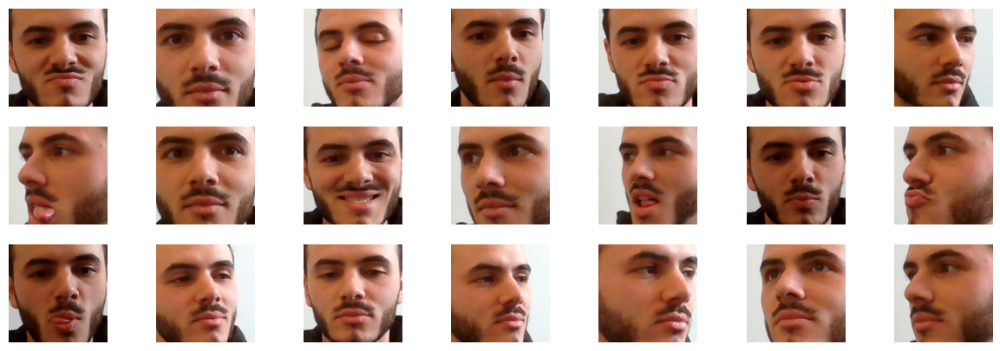

In [126]:
show_grid(data[:21], figsize=(15,5))

In [127]:
encoded_faces = face_encoder(list(data))

In [128]:
encoded_faces.shape

(752, 128)

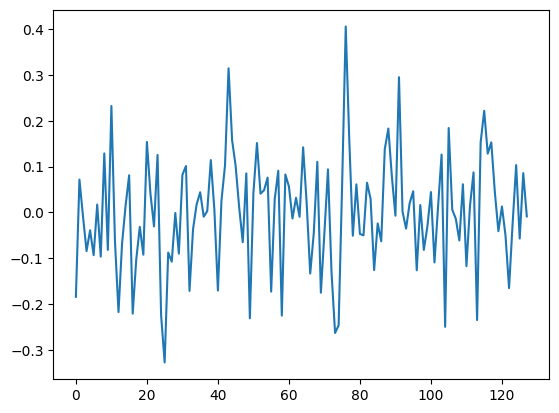

In [129]:
plt.plot(encoded_faces[0])

In [130]:
# Séparer les données et les étiquettes
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(encoded_faces, label_cat, test_size=0.3, random_state=42)

(226, 128)
(226, 12)


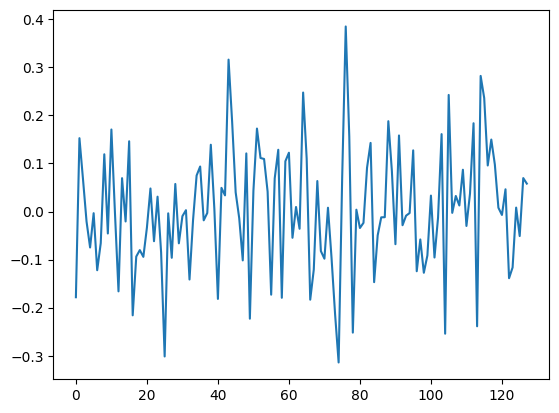

In [131]:
print(X_test.shape)
print(y_test.shape)
plt.plot(X_train[0])

In [132]:
X_valid, y_valid = X_train[int(len(X_train)*0.7):], y_train[int(len(y_train)*0.7):]
X_train, y_train = X_train[:int(len(X_train)*0.7)], y_train[:int(len(y_train)*0.7)]

In [133]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)

(368, 128) (368, 12)
(158, 128) (158, 12)


In [134]:
model_encoding = models.Sequential()
model_encoding.add(layers.Dense(1024, activation="relu"))
model_encoding.add(layers.Dense(nb_classe, activation='softmax'))

In [135]:
model_encoding.compile(optimizer=optimizers.Adam(lr=1e-4), loss="categorical_crossentropy", metrics=["acc"]) 

In [136]:
start_time = time.time()
history = model_encoding.fit(X_train, y_train, epochs=10, batch_size=8, validation_data=(X_valid, y_valid)) 
training_time = time.time() - start_time

Epoch 1/10
46/46 [==============================] - 1s 8ms/step - loss: 2.2755 - acc: 0.3424 - val_loss: 2.0067 - val_acc: 0.3924
Epoch 2/10
46/46 [==============================] - 0s 5ms/step - loss: 1.6466 - acc: 0.8342 - val_loss: 1.3227 - val_acc: 0.9051
Epoch 3/10
46/46 [==============================] - 0s 4ms/step - loss: 0.9538 - acc: 0.9484 - val_loss: 0.7570 - val_acc: 0.9177
Epoch 4/10
46/46 [==============================] - 0s 5ms/step - loss: 0.5237 - acc: 0.9647 - val_loss: 0.4202 - val_acc: 0.9810
Epoch 5/10
46/46 [==============================] - 0s 5ms/step - loss: 0.3100 - acc: 0.9891 - val_loss: 0.2748 - val_acc: 0.9873
Epoch 6/10
46/46 [==============================] - 0s 5ms/step - loss: 0.2060 - acc: 0.9864 - val_loss: 0.2037 - val_acc: 0.9873
Epoch 7/10
46/46 [==============================] - 0s 5ms/step - loss: 0.1575 - acc: 0.9891 - val_loss: 0.1538 - val_acc: 0.9937
Epoch 8/10
46/46 [==============================] - 0s 5ms/step - loss: 0.1178 - acc: 0.99

In [137]:
print(f"Training time: {training_time:.4f} seconds")

Training time: 3.3125 seconds


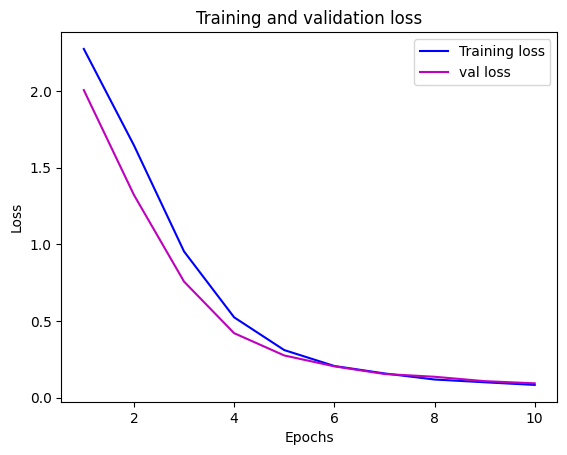

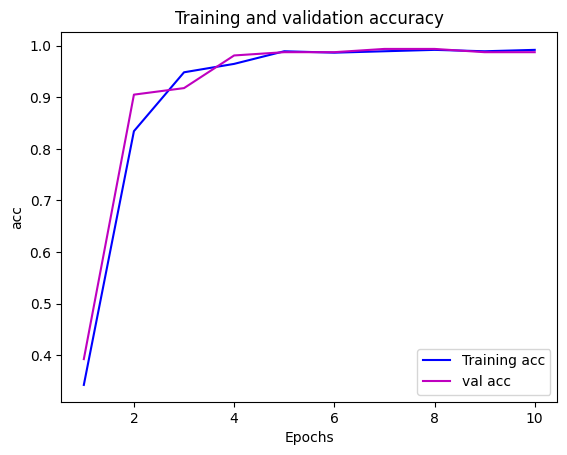

In [138]:
train_acc = history.history['acc']
val_acc = history.history['val_acc']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_loss, linestyle='-', color='b', label='Training loss')
plt.plot(epochs, val_loss, linestyle='-', color='m', label='val loss')

plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()


plt.figure()
plt.plot(epochs, train_acc, linestyle='-', color='b', label='Training acc')
plt.plot(epochs, val_acc, linestyle='-', color='m', label='val acc')

plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('acc')
plt.legend()

plt.show()

In [139]:
proba = model_encoding.predict(X_test)

8/8 [==============================] - 0s 2ms/step


In [140]:
np.sum(proba[0])

0.99999994

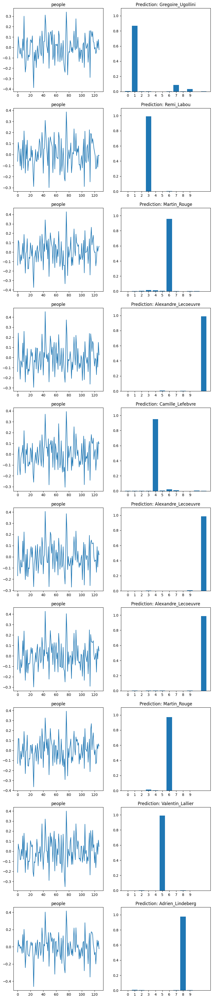

In [141]:
n = 10
batch_size = np.random.randint(0, 54)

inputs  = X_test[batch_size : n+batch_size]
outputs = proba[batch_size : n+batch_size]

f, ax = plt.subplots(10 ,2, figsize=(10,50))
for i in range(n):
    ax[i,0].plot(inputs[i])
    ax[i,0].set_title("people")
    ax[i,1].bar(range(nb_classe), outputs[i])
    ax[i,1].set_title(f"Prediction: {d_pred[np.argmax(outputs[i])]}")
    ax[i,1].set_xticks(range(10))
    ax[i,1].set_ylim((0,1.1))
    
plt.show()

In [142]:
test_loss, test_acc = model_encoding.evaluate(X_test, y_test)

print("Test accuracy:", test_acc*100, "%")

8/8 [==============================] - 0s 7ms/step - loss: 0.0942 - acc: 0.9867
Test accuracy: 98.67256879806519 %


In [97]:
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
del model_encoding
gc.collect()

125687

## 4. Face recognition

This last step is actually the easiest one in the whole process. All you have to do is find the person in your database of known people who has the closest measurements to some test image. You can do that by using any machine learning classification algorithm, such as neaural network (as you did in the previous section), logistic regression, SVM, nearest neighbours, etc. All you need to do is training a classifier that can take in the measurements from a new test image, and tells which known person is the closest match. Running this classifier must only take milliseconds, so that you can apply it to video sequences.

<img src="https://perso.esiee.fr/~najmanl/FaceRecognition/figures/test.gif" style="height:300px;">

### Assignment

Here's what you are required to do for this part of the assignment.

-  Train several classifiers (logistic regression, SVM, kNN, neural network) on the dataset of encoded faces (you can use the package `scikit-learn`).

- Evaluate their performance on the test set, in terms of accuracy and speed.

- Finally, run your best classifier on the test images and video available in the `test` folder.

#### Provided functions

In [143]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import learning_curve
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier


In [144]:
with open("image.pickle", "rb") as f:
    data, labels = pickle.load(f)

labels = np.array(labels)
data = np.array(data)

encoded_faces = face_encoder(list(data))

d_enc = {i: j for i, j in zip(list_labels, range(nb_classe))}
d_enc_pred = {j: i for i, j in zip(list_labels, range(nb_classe))}

l = np.array([d_enc[i] for i in labels])
print(l.shape)  

# Séparer les données et les étiquettes
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(encoded_faces, l, test_size=0.3, random_state=42)

(752,)


In [145]:
X_valid, y_valid = X_train[int(len(X_train)*0.7):], y_train[int(len(y_train)*0.7):]
X_train, y_train = X_train[:int(len(X_train)*0.7)], y_train[:int(len(y_train)*0.7)]

In [146]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)
print(X_test.shape, y_test.shape)

(368, 128) (368,)
(158, 128) (158,)
(226, 128) (226,)


In [147]:
#logistic regression

In [148]:
clf = LogisticRegression()

start_time = time.time()
clf.fit(X_train, y_train)
training_time = time.time() - start_time

# Évaluation du modèle avec la validation croisée sur le jeu de données de validation
scores = cross_val_score(clf, X_valid, y_valid, cv=5)

# Affichage des scores de validation croisée
print(f"Accuracy: {np.mean(scores)*100}%" )
print(f"Training time: {training_time:.4f} seconds")

Accuracy: 98.70967741935483%
Training time: 0.0433 seconds


In [149]:
# Utiliser le modèle optimisé pour prédire de nouveaux exemples
y_pred = clf.predict(X_test)

# Calculer l'exactitude des prédictions
acc = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {acc*100}%")

Prediction Accuracy: 98.67256637168141%


In [150]:
#SVM

In [151]:
SVM_test = svm.SVC()

# Définition des paramètres à tester
params = {'C': [0.1, 1, 10, 15, 20], 'kernel': ['linear', 'rbf'], 'gamma': [0.1, 1, 10, 15, 20]}
params2 = {'C': [0.5, 0.6, 0.7, 0.8, 0.9, 0.8, 1, 2, 3], 'kernel': ['linear'], 'gamma': [ 0.01, 0.03, 0.05, 0.07, 0.08, 0.1, 0.2, 0.3, 0.4, 0.5]}

test = GridSearchCV(SVM_test, params2, cv=5, n_jobs=-1)
# Entraînement du modèle sur le jeu de données de train
history = test.fit(X_train, y_train)

# Afficher le meilleur paramètre C trouvé
print("Best parameter C: ", test.best_params_['C'])
print("Best parameter kernel: ", test.best_params_['kernel'])
print("Best parameter gamma: ", test.best_params_['gamma'])

Best parameter C:  0.6
Best parameter kernel:  linear
Best parameter gamma:  0.01


In [152]:
clf_svm = svm.SVC(kernel= test.best_params_['kernel'], gamma= test.best_params_['gamma'])

start_time = time.time()
clf_svm.fit(X_train, y_train)
training_time = time.time() - start_time

# Évaluation du modèle avec la validation croisée sur le jeu de données de validation
scores_svm = cross_val_score(clf_svm, X_valid, y_valid, cv=5)

# Affichage des scores de validation croisée
print(f"Accuracy: {np.mean(scores_svm)*100}%" )
print(f"Training time: {training_time:.4f} seconds")

Accuracy: 99.35483870967742%
Training time: 0.0129 seconds


In [153]:
# Utiliser le modèle optimisé pour prédire de nouveaux exemples
y_pred = clf_svm.predict(X_test)

# Calculer l'exactitude des prédictions
acc = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {acc*100}%")

Prediction Accuracy: 98.67256637168141%


In [154]:
#knn

In [155]:
clf_knn = KNeighborsClassifier()

start_time = time.time()
clf_knn.fit(X_train, y_train)
training_time = time.time() - start_time

# Évaluation du modèle avec la validation croisée sur le jeu de données de validation
scores_knn = cross_val_score(clf_knn, X_valid, y_valid, cv=5)

# Affichage des scores de validation croisée
print(f"Accuracy: {np.mean(scores_knn)*100}%" )
print(f"Training time: {training_time:.4f} seconds")

Accuracy: 98.72983870967742%
Training time: 0.0017 seconds


In [156]:
# Utiliser le modèle optimisé pour prédire de nouveaux exemples
y_pred = clf_knn.predict(X_test)

# Calculer l'exactitude des prédictions
acc = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {acc*100}%")

Prediction Accuracy: 99.11504424778761%


In [157]:
#neural network

In [158]:
clf_nn = MLPClassifier(hidden_layer_sizes=(128,64), max_iter=500)

start_time = time.time()
clf_nn.fit(X_train, y_train)
training_time = time.time() - start_time

# Évaluation du modèle avec la validation croisée sur le jeu de données de validation
scores_nn = cross_val_score(clf_nn, X_valid, y_valid, cv=5)

# Affichage des scores de validation croisée
print(f"Accuracy: {np.mean(scores_nn)*100}%" )
print(f"Training time: {training_time:.4f} seconds")

Accuracy: 98.72983870967742%
Training time: 1.4663 seconds


In [159]:
# Utiliser le modèle optimisé pour prédire de nouveaux exemples
y_pred = clf_nn.predict(X_test)

# Calculer l'exactitude des prédictions
acc = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {acc*100}%")

Prediction Accuracy: 98.67256637168141%


In [160]:
#comparaison des résultats des classifieurs
classifiers = {'Logistic Regression': LogisticRegression(max_iter=1000),
               'SVM': svm.SVC(kernel= test.best_params_['kernel'], gamma= test.best_params_['gamma']),
               'kNN': KNeighborsClassifier(n_neighbors=5),
               'Neural Network': MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500)}


for name in classifiers.keys():
    clf = classifiers[name]
    start_time = time.time()
    pipeline = make_pipeline(clf)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    val_accuracy = accuracy_score(y_test, y_pred)
    duration = time.time() - start_time
    print(f"{name}: Validation Accuracy: {val_accuracy * 100:.2f}% -> Time: {duration:.4f}s")

Logistic Regression: Validation Accuracy: 98.67% -> Time: 0.0522s
SVM: Validation Accuracy: 98.67% -> Time: 0.0201s
kNN: Validation Accuracy: 99.12% -> Time: 0.0348s
Neural Network: Validation Accuracy: 98.67% -> Time: 3.6763s


The best classifier in terms of accuracy is the neural network, but it is the worst in terms of speed, the SVM classifier being the fastest.

In [161]:
def process_frame(image, model, mode="fast"):
    
    # face detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if mode == "fast":
        matches = hog_detector(gray,1)
    else:
        matches = cnn_detector(gray,1)
        matches = [m.rect for m in matches]
        
    for rect in matches:
        
        # face landmarks
        landmarks = pose68(gray, rect)
        
        # face encoding
        encoding = cnn_encoder.compute_face_descriptor(image, landmarks)
        encoding = np.array(encoding).reshape(1, 128)
        proba = model.predict(encoding)
        # face classification
        if (model == model_encoding):
          label = f"{d_pred[np.argmax(proba)]}"
        else:
          label = f"{d_enc_pred[int(proba)]}"

        
        # draw box
        cv2.rectangle(image, (rect.left(), rect.top()), (rect.right(), rect.bottom()), (0, 255, 0), 2)
        y = rect.top() - 15 if rect.top() - 15 > 15 else rect.bottom() + 25
        cv2.putText(image, label, (rect.left(), y), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (0, 255, 0), 2)
        
    return image

**Note:** cv2.VideoCapture does not work in Google Colab. You can use https://colab.research.google.com/notebooks/snippets/advanced_outputs.ipynb#scrollTo=2viqYx97hPMi to capture video 'on the fly' with Google Colab. The following function has to be modified accordingly

In [117]:
from google.colab.patches import cv2_imshow
import cv2

def process_movie(video_name, mode="fast"):
    
    video  = cv2.VideoCapture(video_name)

    try:
        
        while True:

            # Grab a single frame of video
            ret, frame = video.read()
            
            # Resize frame of video for faster processing
            frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)

            # Quit when the input video file ends or key "Q" is pressed
            key = cv2.waitKey(1) & 0xFF
            if not ret or key == ord("q"):
                break

            # Process frame
            image = process_frame(frame, mode)

            # Display the resulting image
            cv2_imshow( image)
    
    finally:
        video.release()
        cv2.destroyAllWindows()
        print("Video released")

#### Hints

The provided function `process_frame()` detects and encodes all the faces in the input image.

In [118]:
!wget https://perso.esiee.fr/~najmanl/FaceRecognition/test.zip
!unzip test.zip

--2023-04-21 19:00:31--  https://perso.esiee.fr/~najmanl/FaceRecognition/test.zip
Resolving perso.esiee.fr (perso.esiee.fr)... 147.215.150.8
Connecting to perso.esiee.fr (perso.esiee.fr)|147.215.150.8|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12530126 (12M) [application/zip]
Saving to: ‘test.zip’

test.zip            100%[===================>]  11.95M  33.5MB/s    in 0.4s    

2023-04-21 19:00:32 (33.5 MB/s) - ‘test.zip’ saved [12530126/12530126]

Archive:  test.zip
   creating: test/
  inflating: test/lunch_scene.mp4    
   creating: __MACOSX/test/
  inflating: __MACOSX/test/._lunch_scene.mp4  
  inflating: test/example_03.png     
  inflating: __MACOSX/test/._example_03.png  
  inflating: test/example_02.png     
  inflating: __MACOSX/test/._example_02.png  
  inflating: test/example_01.png     
  inflating: __MACOSX/test/._example_01.png  
  inflating: __MACOSX/._test         


In [162]:
image = cv2.imread("/content/drive/MyDrive/projet_deep_learning/photo_test_fin/photo_test_2.png")

In [163]:
processed = process_frame(image.copy(), clf_svm)
processed = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)

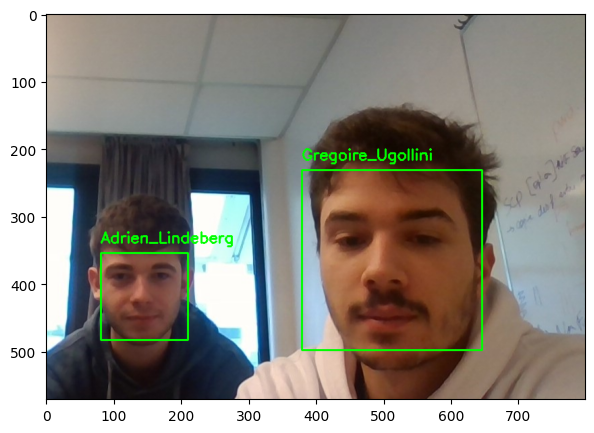

In [164]:
plt.figure(figsize=(15,5))
plt.imshow(processed)

The provided function `process_frame()` detects and encodes the faces in the input video.

The special input `0` can be used to access the webcam.

In [ ]:
process_movie(0)

## 5. Build a custom dataset

So far, you have used a pre-curated dataset, where somebody did the hard work of gathering and labeling the images for you. Now, you will tackle the problem of recognizing faces of yourselves, friends, family members, colleagues, etc. To accomplish this, you need to gather examples of faces you want to recognize. You can enroll facial pictures via a webcam attached to your computer.

### Assignment
Here's what you are required to do for this part of the assignment.

- Use your webcam to enroll face pictures of yourself, your friends, etc. To do so, you need to open the webcam, detect faces in the video stream, and save the captured face images to disk. 


- Build a dataset of reasonable size: a group of 10-15 people with 50-100 face pictures each, taken in different conditions of light, angle, emotion, etc.


- Apply the previously developed pipeline to build your own personalized face recognition system.

---
## Credits

This assignment is based on Adam Geitgey's [post](https://medium.com/@ageitgey/machine-learning-is-fun-part-4-modern-face-recognition-with-deep-learning-c3cffc121d78).

---